In [ ]:
import os
import torch
from IPython.display import Image, clear_output 
print('PyTorch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

PyTorch 1.12.1+cu113 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [ ]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

Cloning into 'yolov5'...
remote: Enumerating objects: 11726, done.
remote: Counting objects: 100% (94/94), done.
remote: Compressing objects: 100% (65/65), done.
remote: Total 11726 (delta 37), reused 59 (delta 29), pack-reused 11632
Receiving objects: 100% (11726/11726), 12.47 MiB | 21.35 MiB/s, done.
Resolving deltas: 100% (8033/8033), done.
/content/yolov5
     |████████████████████████████████| 596 kB 7.4 MB/s 
     |████████████████████████████████| 1.6 MB 54.4 MB/s 
     |████████████████████████████████| 145 kB 9.2 MB/s 
     |████████████████████████████████| 178 kB 48.8 MB/s 
     |████████████████████████████████| 1.1 MB 48.9 MB/s 
     |████████████████████████████████| 67 kB 2.2 MB/s 
     |████████████████████████████████| 54 kB 2.7 MB/s 
     |████████████████████████████████| 138 kB 53.5 MB/s 
     |████████████████████████████████| 62 kB 1.5 MB/s 


In [ ]:
%cd /content/
num_classes='3'
##write custom model .yaml
#you can configure this based on other YOLOv5 models in the models directory
with open('yolov5/models/custom_yolov5s.yaml', 'w') as f:
  # parameters
  f.write('nc: ' + num_classes + '\n')
  #f.write('nc: ' + str(len(class_labels)) + '\n')
  f.write('depth_multiple: 1.0'  + '\n') # model depth multiple
  f.write('width_multiple: 1.0'  + '\n')  # layer channel multiple
  f.write('\n')
  f.write('anchors:' + '\n')
  f.write('  - [10,13, 16,30, 33,23] ' + '\n')
  f.write('  - [30,61, 62,45, 59,119]' + '\n')
  f.write('  - [116,90, 156,198, 373,326] ' + '\n')
  f.write('\n')
print('custom model config written!')

/content
custom model config written!


In [ ]:
%cd /content/yolov5/models/
!python yolo.py --cfg custom_yolov5s.yaml  # verify

/content/yolov5/models
models/yolo: cfg=custom_yolov5s.yaml, batch_size=1, device=, profile=False, line_profile=False, test=False
YOLOv5 🚀 v6.2-5-ge83b422 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)


                 from  n    params  module                                  arguments                     
  0                -1  1       928  models.common.Conv                      [3, 32, 3, 1]                 
  1                -1  1      9280  models.common.Conv                      [32, 32, 3, 1]                
  2                -1  1         0  torch.nn.modules.pooling.MaxPool2d      [2, 2]                        
  3                -1  1     18560  models.common.Conv                      [32, 64, 3, 1]                
  4                -1  1     36992  models.common.Conv                      [64, 64, 3, 1]                
  5                -1  1         0  torch.nn.modules.pooling.MaxPool2d      [2, 2]                        
  6                -1  1     7398

In [ ]:
# Export code snippet and paste here
%cd /content
!curl -L "https://public.roboflow.com/ds/GCYI9xfoQZ?key=8uYWHUuj58" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   3662      0 --:--:-- --:--:-- --:--:--  3647
100 7835k  100 7835k    0     0  12.3M      0 --:--:-- --:--:-- --:--:-- 12.3M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/BloodImage_00038_jpg.rf.63d04b5c9db95f32fa7669f72e4903ca.jpg  
 extracting: test/images/BloodImage_00044_jpg.rf.589ee3d351cb6d9a3f7b7a942da5370a.jpg  
 extracting: test/images/BloodImage_00062_jpg.rf.1cecc20a21ac39cb54cf532081a1e893.jpg  
 extracting: test/images/BloodImage_00090_jpg.rf.5267690cb6a13608d39b0424bef3c9b4.jpg  
 extracting: test/images/BloodImage_00099_jpg.rf.744666666386a07e242e214e041945ba.jpg  
 extracting: test/images/BloodImage_00112_jpg.rf.e4b5

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# update the roboflow.data file with correct number of classes
%cd /content
file = open("/content/data.yaml", "w") 
file.write("path: /content/gdrive/MyDrive/data/\n") 
file.write("train: /content/gdrive/MyDrive/data/train/\n")  
file.write("val: /content/gdrive/MyDrive/data/val/\n")  
file.write("nc: 1\n")  
file.write("names: ['Pea']\n")
file.close()

/content


In [ ]:
!cp /content/data.yaml /content/yolov5/data/data.yaml
%cat /content/yolov5/data/data.yaml

train: ../train/images
val: ../valid/images

nc: 3
names: ['Platelets', 'RBC', 'WBC']

In [ ]:
%cd /content/yolov5

/content/yolov5


In [ ]:
!cp /content/gdrive/MyDrive/last.pt /content

In [ ]:
#!python train.py --data data/data.yaml --cfg yolov5s.yaml --hyp '/content/gdrive/MyDrive/hyp_evolve.yaml' --batch-size 64 --imgsz 320 --epochs 200 --weights '' --cache
!python train.py --data data/data.yaml --cfg custom_yolov5s.yaml --batch-size 16 --imgsz 416 --epochs 50 --weights '' --cache
#!python train.py --data data/data.yaml --cfg yolov5s.yaml --batch-size 64 --imgsz 320 --epochs 10 --weights '' --cache --evolve 10

train: weights=, cfg=custom_yolov5s.yaml, data=data/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-5-ge83b422 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hs

In [ ]:
!rm -r /content/last.pt
!rm -r /content/gdrive/MyDrive/last.pt
!cp /content/yolov5/runs/train/exp/weights/last.pt /content/gdrive/MyDrive/

rm: cannot remove '/content/last.pt': No such file or directory


In [ ]:
!ls -l /content/gdrive/MyDrive/

total 2284739
-rw-r--r-- 1 root root     367112 Apr  9  2021  arial.ttf
drwxr-xr-x 1 root root       4096 Apr 11  2021 'Colab Notebooks'
drwxr-xr-x 1 root root       4096 Mar 25  2021  data
drwxr-xr-x 1 root root       4096 Jul 31 22:02  data_volaille
-rw-r--r-- 1 root root 1433478918 Jul 30 11:30  data_volaille.rar
-rw-r--r-- 1 root root     322092 Jan 14 22:35  evolve.png
-rw-r--r-- 1 root root         37 Jun 30  2021  final_label_map.pbtxt
-rw-r--r-- 1 root root  262904484 Apr 13  2021  final_test.record
-rw-r--r-- 1 root root   48438181 Apr 13  2021  final_train.record
-rw-r--r-- 1 root root      19732 Oct  5 09:29  HABIB_Mohammed_AgriNov2021.docx
-rw-r--r-- 1 root root      53038 Sep 17 17:39  HABIB_Mohammed_AgriNov2021.pdf
-rw-r--r-- 1 root root     833422 Oct 26 09:50  HABIB_Mohammed_ESTaiet2021.docx
-rw-r--r-- 1 root root        844 Jan 14 22:35  hyp_evolve.yaml
-rw-r--r-- 1 root root  252372233 Dec  9 17:34  last_copy.pt
-rw-r--r-- 1 root root   14327605 Jan 24 23:33  last.pt


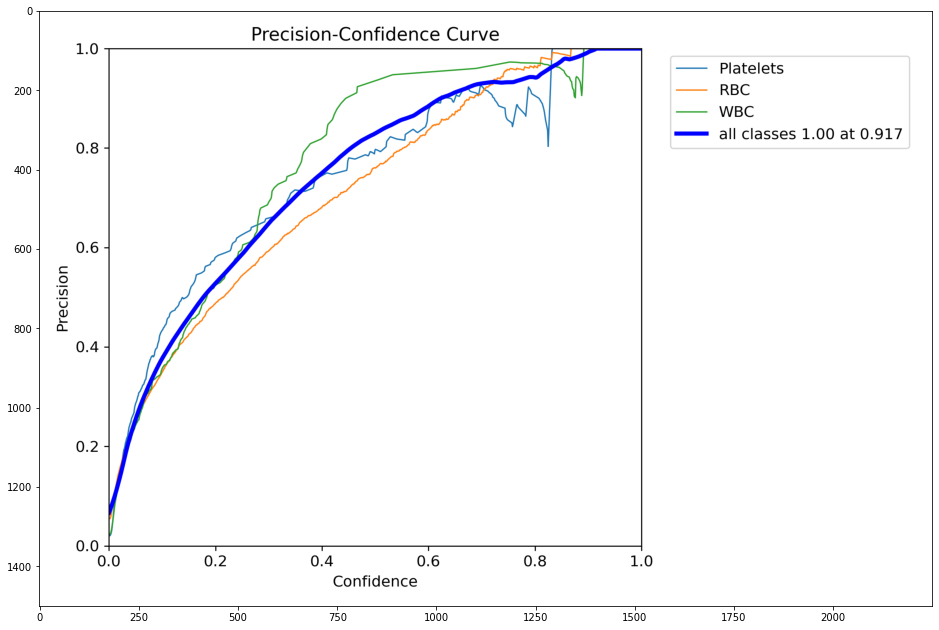

In [ ]:
import matplotlib.pyplot as plt
img=plt.imread('/content/yolov5/runs/train/exp2/P_curve.png')
plt.figure(figsize=(16, 24))
plt.imshow(img)

In [ ]:
import matplotlib.pyplot as plt
img=plt.imread('/content/yolov5/runs/evolve/exp/evolve.png')
plt.figure(figsize=(16, 24))
plt.imshow(img)

In [ ]:
#!cp /content/yolov5/runs/evolve/exp/evolve.png /content/gdrive/MyDrive/
#!cp /content/yolov5/runs/evolve/exp/hyp_evolve.yaml /content/gdrive/MyDrive/
!cp /content/yolov5/runs/train/exp/*.png /content/gdrive/MyDrive/

## Conduct inference and display results



### Conduct inference

The below script has a few key arguments we're using:
- **Weights**: we're specifying the weights to use for our model should be those that we most recently used in training
- **Source**: we're specifying the source images we want to use for our predictions
- **Names**: we're defining the names we want to use. Here, we're referencing `roboflow_data.names`, which we created from our Roboflow `_darknet.labels`italicized text above.

In [ ]:
import shutil
!rm -r /content/output
!mkdir /content/output/
#final testing folder
!cp /content/gdrive/MyDrive/data/test/*.jpg /content/output/

rm: cannot remove '/content/output': No such file or directory


In [ ]:
!python val.py --weights /content/last.pt --data data/data.yaml --task study

val: data=data/data.yaml, weights=['/content/last.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, task=study, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False

Running study_data_last.txt --imgsz 256...
YOLOv5 🚀 v6.1-132-g014acde torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
YOLOv5m summary: 290 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
val: Scanning '/content/gdrive/MyDrive/data/val.cache' images and labels... 1840 found, 0 missing, 0 empty, 0 corrupt: 100% 1840/1840 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 58/58 [04:02<00:00,  4.17s/it]
                 all       1840       5329       0.99      0.981      0.994      0.882
Speed: 0.1ms pre-process, 7.6ms inference, 2.0ms NMS per image at shape (32, 3, 256, 256)
Resul

In [ ]:
#!python3 detect.py --weights runs/train/exp3/weights/last.pt --source=/content/output 
!python3 detect.py --weights /content/yolov5/runs/train/exp2/weights/best.pt --source=/content/test/images 

detect: weights=['/content/yolov5/runs/train/exp2/weights/best.pt'], source=/content/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.2-5-ge83b422 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 135 layers, 6396536 parameters, 0 gradients, 20.0 GFLOPs
image 1/36 /content/test/images/BloodImage_00038_jpg.rf.63d04b5c9db95f32fa7669f72e4903ca.jpg: 480x640 2 Plateletss, 29 RBCs, 2 WBCs, Done. (0.010s)
image 2/36 /content/test/images/BloodImage_00044_jpg.rf.589ee3d351cb6d9a3f7b7a942da5370a.jpg: 480x640 3 Plateletss, 22 RBCs, 4 WBCs, Done. (0.010s)
image 3/36 /content/test/images/BloodIm

### Displaying our results

Ultralytics generates predictions which include the labels and bounding boxes "printed" directly on top of our images. They're saved in our `output` directory within the YOLOv3 repo we cloned above.

In [ ]:
# import libraries for display
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display, Image
from glob import glob
import random
import PIL

In [ ]:
# grab all images from our output directory
images = [ PIL.Image.open(f) for f in glob('/content/yolov5/runs/detect/exp2/*') ]

In [ ]:
# convert images to numPy
def img2array(im):
    if im.mode != 'RGB':
        im = im.convert(mode='RGB')
    return np.fromstring(im.tobytes(), dtype='uint8').reshape((im.size[1], im.size[0], 3))

In [ ]:
# create array of numPy images
np_images = [ img2array(im) for im in images ]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  """


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


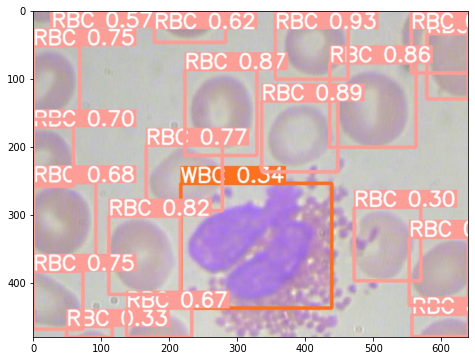

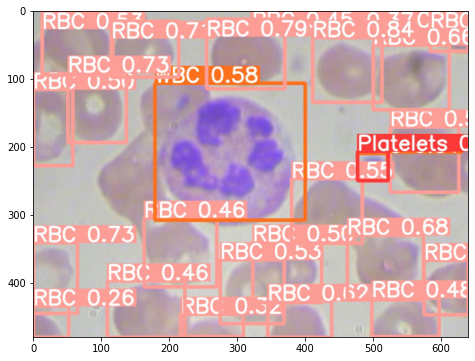

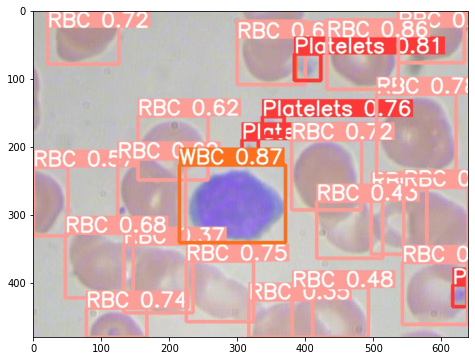

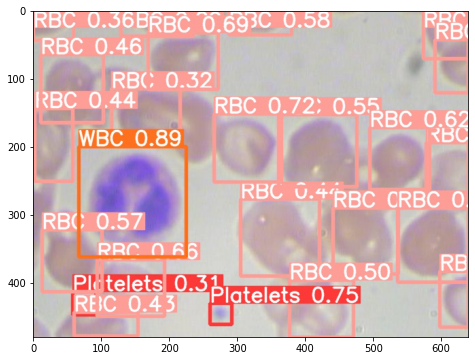

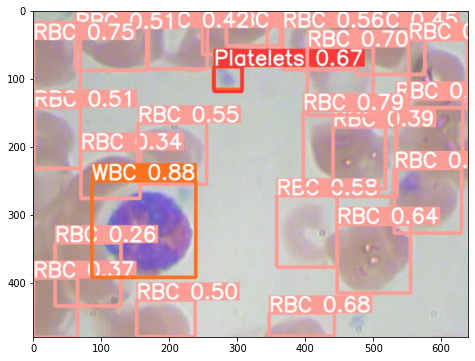

...

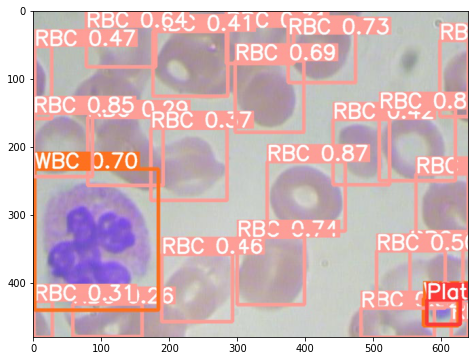

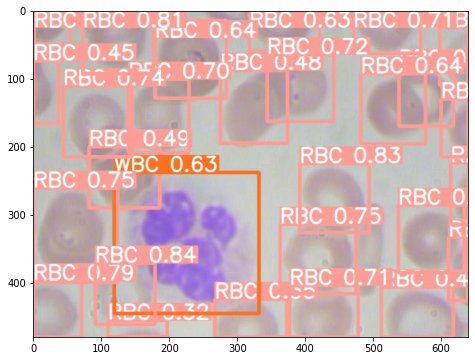

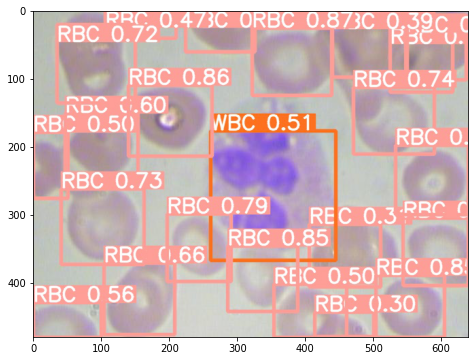

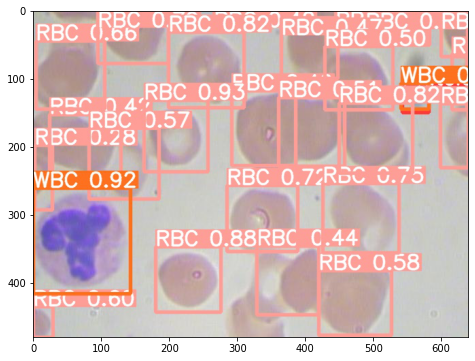

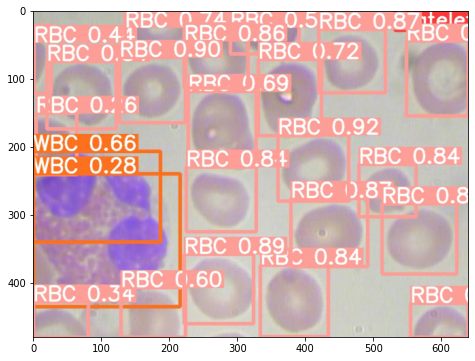

In [ ]:
# plot ALL results in test directory (NOTE: adjust figsize as you please)
for img in np_images:
    plt.figure(figsize=(8, 6))
    plt.imshow(img)

/content/yolov5/runs/detect
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-470
Use 'apt autoremove' to remove it.
The following NEW packages will be installed:
  rar
0 upgraded, 1 newly installed, 0 to remove and 67 not upgraded.
Need to get 295 kB of archives.
After this operation, 799 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/multiverse amd64 rar amd64 2:5.5.0-1 [295 kB]
Fetched 295 kB in 1s (570 kB/s)
Selecting previously unselected package rar.
(Reading database ... 155325 files and directories currently installed.)
Preparing to unpack .../rar_2%3a5.5.0-1_amd64.deb ...
Unpacking rar (2:5.5.0-1) ...
Setting up rar (2:5.5.0-1) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...

RAR 5.50   Copyright (c) 1993-2017 Alexander Roshal   11 Aug 2017
Trial version             Type 'rar -?' for hel

## Save Our Weights

We can save the weights of our model to use them for inference in the future, or pick up training where we left off. 

We can first save them locally. We'll connect our Google Drive, and save them there.


In [ ]:
# save locally
from google.colab import files
files.download('./weights/last.pt')

In [ ]:
# connect Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

In [ ]:
%pwd

In [ ]:
# create a copy of the weights file with a datetime 
# and move that file to your own Drive
%cp ./weights/last.pt ./weights/last_copy.pt
%mv ./weights/last_copy.pt /content/gdrive/My\ Drive

Cloning into 'tensorboard-aggregator'...
remote: Enumerating objects: 39, done.
remote: Counting objects: 100% (13/13), done.
remote: Compressing objects: 100% (13/13), done.
remote: Total 39 (delta 5), reused 1 (delta 0), pack-reused 26
Unpacking objects: 100% (39/39), done.
/content/tensorboard-aggregator
     |████████████████████████████████| 462 kB 5.3 MB/s 


TensorBoard version:  2.8.0


In [ ]:
experiment_id = "events.out.tfevents.1646600044.68c120a3c2a7.617.0.v2"
x = EventAccumulator(path="/content/events.out.tfevents.1646600044.68c120a3c2a7.617.0.v2")
x.Reload()
print(x.Tags())
x.FirstEventTimestamp()
print(x.Tags())

{'images': [], 'audio': [], 'histograms': [], 'scalars': [], 'distributions': [], 'tensors': ['train_input_images', 'steps_per_sec', 'Loss/localization_loss', 'Loss/classification_loss', 'Loss/regularization_loss', 'Loss/total_loss', 'learning_rate'], 'graph': False, 'meta_graph': False, 'run_metadata': []}
{'images': [], 'audio': [], 'histograms': [], 'scalars': [], 'distributions': [], 'tensors': ['train_input_images', 'steps_per_sec', 'Loss/localization_loss', 'Loss/classification_loss', 'Loss/regularization_loss', 'Loss/total_loss', 'learning_rate'], 'graph': False, 'meta_graph': False, 'run_metadata': []}


TypeError: ignored